In [1]:
# Install RDKit.
#%%capture
try:
  import rdkit
except:
  !pip install rdkit
#!pip install rdkit-pypi
try:
  import torch_geometric
except:
  !pip install torch_geometric

In [2]:
# Importing Libraries
import pandas as pd
import warnings

from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem import Descriptors
from rdkit.Chem import AllChem, PandasTools
from rdkit.ML.Descriptors import MoleculeDescriptors

warnings.filterwarnings("ignore")

In [27]:
df = pd.read_csv('lipophilicity_rdkit.csv')
df.shape
df.head()

,CMPD_CHEMBLID,exp,smiles,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,CHEMBL596271,3.54,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14,8.838871,8.838871,0.008322,-4.082382,0.728444,38.208333,340.858,...,0,0,0,0,0,0,0,0,0,0
1,CHEMBL1951080,-1.18,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...,15.117958,15.117958,0.920611,-6.843264,0.545587,34.121212,494.591,...,1,1,0,0,0,0,0,0,0,0
2,CHEMBL1771,3.69,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl,13.321227,13.321227,0.250582,-3.906276,0.807761,36.619048,321.829,...,0,0,0,0,0,0,0,1,0,0
3,CHEMBL234951,3.37,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...,14.213604,14.213604,0.187400,-4.272077,0.506650,33.321429,419.890,...,0,0,0,0,0,0,0,1,0,0
4,CHEMBL565079,3.10,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...,14.167882,14.167882,0.671279,-4.810274,0.747686,30.607143,381.480,...,0,0,0,0,0,0,0,0,0,0


**Create an object of the molecule descriptor class**

In [7]:
##converting SMILES strings from a DataFrame (df) into RDKit molecule objects, 
###adding hydrogens to the molecules, and 
###then appending them back to the DataFrame as a new column (mol)
##By default, RDKit molecules only contain implicit hydrogens 
### (i.e., hydrogens aren't explicitly included in the atom list).
mol_list = []

for smile in df['smiles']:
  mol = Chem.MolFromSmiles(smile)
  mol = Chem.AddHs(mol)
  mol_list.append(mol)

df = pd.concat([df, pd.DataFrame(mol_list, columns = (['mol']))], axis=1)

In [8]:
df.head()

,CMPD_CHEMBLID,exp,smiles,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,...,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,mol
0,CHEMBL596271,3.54,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14,8.838871,8.838871,0.008322,-4.082382,0.728444,38.208333,340.858,...,0,0,0,0,0,0,0,0,0,<rdkit.Chem.rdchem.Mol object at 0x7f0cd8da5d20>
1,CHEMBL1951080,-1.18,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...,15.117958,15.117958,0.920611,-6.843264,0.545587,34.121212,494.591,...,1,0,0,0,0,0,0,0,0,<rdkit.Chem.rdchem.Mol object at 0x7f0cd8da5620>
2,CHEMBL1771,3.69,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl,13.321227,13.321227,0.250582,-3.906276,0.807761,36.619048,321.829,...,0,0,0,0,0,0,1,0,0,<rdkit.Chem.rdchem.Mol object at 0x7f0cd8da54d0>
3,CHEMBL234951,3.37,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...,14.213604,14.213604,0.187400,-4.272077,0.506650,33.321429,419.890,...,0,0,0,0,0,0,1,0,0,<rdkit.Chem.rdchem.Mol object at 0x7f0cd8da5b60>
4,CHEMBL565079,3.10,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...,14.167882,14.167882,0.671279,-4.810274,0.747686,30.607143,381.480,...,0,0,0,0,0,0,0,0,0,<rdkit.Chem.rdchem.Mol object at 0x7f0cd8da6260>


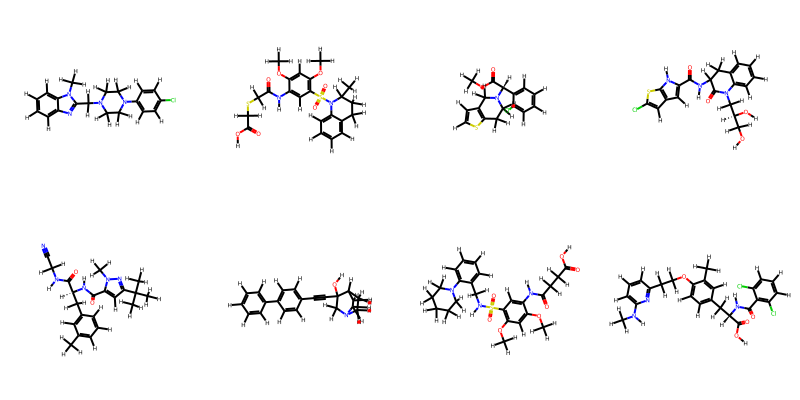

In [9]:
Draw.MolsToGridImage(df['mol'][:8],molsPerRow=4,subImgSize=(200,200))

## **Generating Molecular Descriptors Using RDKit**

**Create an instance of the class to print names and number of descriptors**

In [10]:
Desc_list_func = MoleculeDescriptors.MolecularDescriptorCalculator(x[0] for x in Descriptors._descList)

In [11]:
Desc_list_func

**Call the instance to get names**




In [12]:
names = Desc_list_func.GetDescriptorNames()


**Print the names of descriptors**

In [13]:
names

('MaxAbsEStateIndex',
 'MaxEStateIndex',
 'MinAbsEStateIndex',
 'MinEStateIndex',
 'qed',
 'SPS',
 'MolWt',
 'HeavyAtomMolWt',
 'ExactMolWt',
 'NumValenceElectrons',
 'NumRadicalElectrons',
 'MaxPartialCharge',
 'MinPartialCharge',
 'MaxAbsPartialCharge',
 'MinAbsPartialCharge',
 'FpDensityMorgan1',
 'FpDensityMorgan2',
 'FpDensityMorgan3',
 'BCUT2D_MWHI',
 'BCUT2D_MWLOW',
 'BCUT2D_CHGHI',
 'BCUT2D_CHGLO',
 'BCUT2D_LOGPHI',
 'BCUT2D_LOGPLOW',
 'BCUT2D_MRHI',
 'BCUT2D_MRLOW',
 'AvgIpc',
 'BalabanJ',
 'BertzCT',
 'Chi0',
 'Chi0n',
 'Chi0v',
 'Chi1',
 'Chi1n',
 'Chi1v',
 'Chi2n',
 'Chi2v',
 'Chi3n',
 'Chi3v',
 'Chi4n',
 'Chi4v',
 'HallKierAlpha',
 'Ipc',
 'Kappa1',
 'Kappa2',
 'Kappa3',
 'LabuteASA',
 'PEOE_VSA1',
 'PEOE_VSA10',
 'PEOE_VSA11',
 'PEOE_VSA12',
 'PEOE_VSA13',
 'PEOE_VSA14',
 'PEOE_VSA2',
 'PEOE_VSA3',
 'PEOE_VSA4',
 'PEOE_VSA5',
 'PEOE_VSA6',
 'PEOE_VSA7',
 'PEOE_VSA8',
 'PEOE_VSA9',
 'SMR_VSA1',
 'SMR_VSA10',
 'SMR_VSA2',
 'SMR_VSA3',
 'SMR_VSA4',
 'SMR_VSA5',
 'SMR_VSA6',


**Print the number of descriptors**

In [14]:
len(names)

210

**Again create an object of the molecule descriptor class**

1.   Get Summary of the descriptors
2.   Generate molecular descriptors



In [15]:
MoleculeDescriptors.MolecularDescriptorCalculator(['MolLogP']).GetDescriptorSummaries()

['Wildman-Crippen LogP value']

In [16]:
# create another instance for calculating molecular descriptors

Des_func = MoleculeDescriptors.MolecularDescriptorCalculator(['NumHeteroatoms', 'NumHDonors'])

In [17]:
Des_func

**Calculate one descriptor for a sinlge molecule**

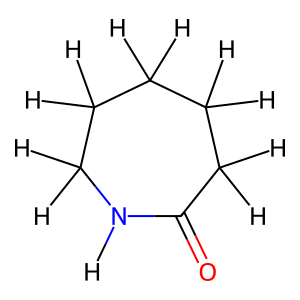

(2, 1)

In [18]:
display(Draw.MolToImage(df['mol'][12]))
Des_func.CalcDescriptors(df['mol'][12])

**Calculate one or more descriptor for the whole dataset**

In [19]:
des = []

for mol in df['mol']:
  des.append(Des_func.CalcDescriptors(mol))

In [20]:
Final_df = pd.concat([df, pd.DataFrame(des, columns=(['NumHeteroatoms', 'NumHDonors']))], axis=1)


In [21]:
Final_df.head()

,CMPD_CHEMBLID,exp,smiles,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,...,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,mol,NumHeteroatoms,NumHDonors
0,CHEMBL596271,3.54,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14,8.838871,8.838871,0.008322,-4.082382,0.728444,38.208333,340.858,...,0,0,0,0,0,0,0,<rdkit.Chem.rdchem.Mol object at 0x7f0cd8da5d20>,5,0
1,CHEMBL1951080,-1.18,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...,15.117958,15.117958,0.920611,-6.843264,0.545587,34.121212,494.591,...,0,0,0,0,0,0,0,<rdkit.Chem.rdchem.Mol object at 0x7f0cd8da5620>,11,2
2,CHEMBL1771,3.69,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl,13.321227,13.321227,0.250582,-3.906276,0.807761,36.619048,321.829,...,0,0,0,0,1,0,0,<rdkit.Chem.rdchem.Mol object at 0x7f0cd8da54d0>,5,0
3,CHEMBL234951,3.37,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...,14.213604,14.213604,0.187400,-4.272077,0.506650,33.321429,419.890,...,0,0,0,0,1,0,0,<rdkit.Chem.rdchem.Mol object at 0x7f0cd8da5b60>,9,4
4,CHEMBL565079,3.10,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...,14.167882,14.167882,0.671279,-4.810274,0.747686,30.607143,381.480,...,0,0,0,0,0,0,0,<rdkit.Chem.rdchem.Mol object at 0x7f0cd8da6260>,7,2


**Calculate all the descriptor for the whole dataset**

In [22]:
# create another instance for calculating molecular descriptors

Des_func = MoleculeDescriptors.MolecularDescriptorCalculator(x[0] for x in Descriptors._descList)

In [23]:
des = []

for mol in df['mol']:
  des.append(Des_func.CalcDescriptors(mol))

[09:42:21] DEPRECATION WARNING: please use MorganGenerator
[09:42:21] DEPRECATION WARNING: please use MorganGenerator
[09:42:21] DEPRECATION WARNING: please use MorganGenerator
[09:42:21] 

****
Pre-condition Violation
bad result vector size
Violation occurred on line 40 in file /project/build/temp.linux-x86_64-cpython-311/rdkit/Code/GraphMol/Descriptors/Crippen.cpp
Failed Expression: logpContribs.size() == mol.getNumAtoms() && mrContribs.size() == mol.getNumAtoms()
----------
Stacktrace:
----------
****

[09:42:21] 

****
Pre-condition Violation
bad result vector size
Violation occurred on line 40 in file /project/build/temp.linux-x86_64-cpython-311/rdkit/Code/GraphMol/Descriptors/Crippen.cpp
Failed Expression: logpContribs.size() == mol.getNumAtoms() && mrContribs.size() == mol.getNumAtoms()
----------
Stacktrace:
----------
****

[09:42:21] 

****
Pre-condition Violation
bad result vector size
Violation occurred on line 40 in file /project/build/temp.linux-x86_64-cpython-311/rdkit/C

In [24]:
Final_df = pd.concat([df, pd.DataFrame(des, columns=(x[0] for x in Descriptors._descList))], axis=1)


In [25]:
Final_df.head()

,CMPD_CHEMBLID,exp,smiles,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,CHEMBL596271,3.54,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14,8.838871,8.838871,0.008322,-4.082382,0.728444,38.208333,340.858,...,0,0,0,0,0,0,0,0,0,0
1,CHEMBL1951080,-1.18,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...,15.117958,15.117958,0.920611,-6.843264,0.545587,34.121212,494.591,...,1,1,0,0,0,0,0,0,0,0
2,CHEMBL1771,3.69,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl,13.321227,13.321227,0.250582,-3.906276,0.807761,36.619048,321.829,...,0,0,0,0,0,0,0,1,0,0
3,CHEMBL234951,3.37,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...,14.213604,14.213604,0.187400,-4.272077,0.506650,33.321429,419.890,...,0,0,0,0,0,0,0,1,0,0
4,CHEMBL565079,3.10,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...,14.167882,14.167882,0.671279,-4.810274,0.747686,30.607143,381.480,...,0,0,0,0,0,0,0,0,0,0


In [26]:
Final_df.drop('mol', axis=1).to_excel('final.xlsx', index=None)